# Monte Carlo Integration ASTR 119 Final
##### Neal Chokshi - nkchoksh - Fall2020

## Welcome to the Monte Carlo Integration Simulator!

Use the TOC to jump around!

### TOC:

[Imports](#imports)

[Main Monte Carlo Class](#monte-class)

[Tolerance and Scaling Explanation](#tol-scale)

[RUN PROGRAM](#run)

[GENERATE ANIMATION](#gen-anim)

[Notes and Results](#notes)



## Imports: <a id='Imports'></a>

In [278]:
%matplotlib inline
import numpy as np
import math
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from scipy import integrate
from IPython.display import clear_output
from IPython.display import HTML

plt.rcParams['animation.embed_limit'] = 30

## Monte Carlo Class:  <a id='monte-class'></a>

In [279]:
class MontePlots:
    def __init__(self, fun, x0, x1, tol=0.01, min_points=100, point_scl=1):
        # CONSTRUCTOR ARGS ===
        self.points = min_points # minimum points to use in simulation
        self.max_points = 999999 # upper bounds of points to use     
        self.tol = tol # tolerance between each precision calculation of monte carlo
        self.int_fun = fun # integration function
        self.point_scale = point_scl # scaling factor for additional points 
        self.x_bounds = [x0, x1] # set integration boundaries
        # ===
        
        # VARIABLES SETUP ===
        self.monte_complete = False # has monte been run?
        self.cur_points = 0 # current number of points graphed on monte carlo plot
        
        self.exp_int, e = integrate.quad(self.int_fun, x0, x1) # integrate function with bounds using .quad() from scipy
        

        self.it_n = 0 # iteration number (frame number) of the animation
 
        
        self.max_frames = 85. # maximum amount of frames to use in animation method
        self.point_frame_inc = 1 # setup variable to store point increments per frame in the animation
        
        self.mX, self.mY, self.mC = [], [], [] # empty data for x,y plot points and color data
        self.monte_results = [] # empty data for storing results of integration per point add
        self.total_under = 0. # total amount of points that fell under the curve
        self.monte_scat = None # nil assignment to scatter plot object
        self.anim = None # nil assignment to animation object
        
        
        # PLOTS SETUP ===
        # setup titles and subplots
        self.fig = plt.figure(figsize=(12, 6), dpi=100)
        self.fig.suptitle("Monte Carlo Integration")
        self.ax = self.fig.add_subplot(1, 2, 1)
        self.ax.set_title("Monte Carlo n={0}".format(0))
        
        # graph function with dotted lines for integration range and axes
        x_range = np.arange(x0-0.5, x1+0.5, 0.01)
        self.ax.plot(x_range, self.int_fun(x_range))
        self.ax.axhline(y=0, color='gray', linestyle='--')
        self.ax.axvline(x=0, color='gray', linestyle='--')
        self.ax.axvline(x=x0, color='red', linestyle='dotted')
        self.ax.axvline(x=x1, color='red', linestyle='dotted')
        
        # determine max y bound using plot
        upper_y = max([abs(a) for a in self.ax.get_ylim()])
        self.y_bounds = [0, upper_y]
        
        # set up error plot with dotted line at expected integral value
        self.ax2 = self.fig.add_subplot(1, 2, 2)
        self.ax2.set_title("Integral Error (cur={0}, error={1}, n={2})".format("nil", 'inf', 0))
        self.ax2.axhline(y=self.exp_int, color="red", linestyle="--", label="Exp: %0.3f" % self.exp_int)
        # assign legend
        handles, labels = self.ax2.get_legend_handles_labels()
        self.ax2.legend(handles, labels)
        # ===
        

    def run_monte(self):
        """
        run_monte()
        
        Run Monte Carlo simulation starting at some x amounts of points determined at initialization
        function will increase amount of points based on scale factor and check if the error of the last run
        was within the tolerance value and new error of the more precise run is consistent with that result. If
        not, more points are added until condition is met.
        
        fills various field for animation
        
        """
        def generate_point():
            """
            generate_point()
            
            Subfunction of run_monte() that generates a single point of a monte carlo simulation
            
            """
            
            # get a random points from a uniform distribution
            x = np.random.uniform(self.x_bounds[0], self.x_bounds[1])

            yo = self.int_fun(x) # y output from function

            # have a multiplier that is -1 if the point falls below the graph
            m = 1
            if yo < 0:
                m = -1
            y = np.random.uniform(self.y_bounds[0], self.y_bounds[1]) * m
            
            # default color
            col = 'blue'
            # check if y output is positive or negative
            # then check if our random point is above or over the graph based on yo 
            # if the point falls in between, change color to yellow and update total under accordingly
            if yo >= 0 and 0 < y < yo:
                col = 'yellow'
                self.total_under += 1.
            elif yo < 0:
                if 0 > y > yo:
                    col = 'yellow'
                    # remove from total_under as the point has falled between the graph when the expected
                    # output is < 0, so a negative portion of the integral
                    self.total_under -= 1.
#                 else:
#                     # move point back up since its blue
#                     y *= -1
                
            # add data to storage
            self.mC.append(col)
            self.mX.append(x)
            self.mY.append(y)
            
            # increment current points 
            self.cur_points += 1
            
            # add monte carlo estimate result to storage
            self.monte_results.append(self.monte_result())
        
        if not self.monte_complete:
            # if monte carlo has not been run before, do it!
            
            # flush storage 
            self.mX, self.mY, self.mC = [], [], []
            # generate initial amount of points
            for i in range(self.cur_points, self.points):
                generate_point()

            # set up current and new error values
            # like to to make sure we run monte again atleast once
            cur_err = self.tol + 1
            new_err = self.tol + 1

            # store how many points we started with
            init_points = self.points

            # while the current error of the sim is bigger than tolerance 
            # and the new, more precise run, is also bigger than the tolerance 
            # keep adding points
            while cur_err > self.tol and new_err > self.tol:
                # get current error
                cur_err = abs(self.exp_int - self.monte_result())
                
                # calculate new total points
                if self.point_scale == 1:
                    self.points += init_points
                else:
                    self.points *= self.point_scale
                    self.points = round(self.points)
                
                # add more points to simulation
                for i in range(0, self.points - self.cur_points):
                    generate_point()
                    
                # make sure theres not too many points
                if self.points >= self.max_points:
                    print("Maximum point limit reached!")
                    break
                
                # calculate new error based on added points
                new_err = abs(self.exp_int - self.monte_result())
                # next check of while loop will see if the new error
                # is consistent in terms of the tolerance with the 
                # last run of montecarlo
            
            
            # after simulation is run, plot points and annotate axes, titles, etc
            self.monte_scat = self.ax.scatter(self.mX, self.mY, c=self.mC)
            self.err_line, = self.ax2.plot(range(0, self.points), self.monte_results, 'g')

            self.ax2.set_title("Integral Error (cur=%.4f, error=%.3f, n=%d)" % (self.monte_result(), new_err, self.points))
            self.ax.set_title("Monte Carlo n={0}".format(self.points))
        
        # calculate how many points to plot each frame
        self.point_frame_inc = math.ceil(self.points / self.max_frames)
        
        # flag monte complete
        self.monte_complete = True
        
    def init_monte_plot(self):
        """
        init_monte_plot()
        
        prepare animation objects for animation by flushing data
        
        """
        # initialize clean plots for montecarlo
        
        # scatter plot wants data in [ [x, y], [x1, y1] ...]
        self.monte_scat.set_offsets([[], []])
        
        # set data for line wants data in [ [x, x1...], [y, y1 ...]]
        self.err_line.set_data([], [])
        
        # return both objects 
        return self.monte_scat, self.err_line,
    
    def update_monte(self, i):
        """
        update_monte()
        
        update animation objects for each frame of animation
        
        each frame will be loaded with data collected with run_monte()
        
        """
        
        # add in data from 0 - current fram number from x and y lists
        # put in list(zip()) for proper input structure to set_offsets()
        self.monte_scat.set_offsets(list(zip(self.mX[:self.it_n], self.mY[:self.it_n])))
        self.ax.set_title("Monte Carlo n={0}".format(self.it_n)) # update title
        
        # add error data range based on data collected in monte_results from 0 - frame #
        self.err_line.set_data(range(0, self.it_n), self.monte_results[0:self.it_n])
        
        # get current error and add it to title
        err = abs(self.exp_int - self.monte_results[self.it_n])
        self.ax2.set_title("Integral Error (cur=%.4f, error=%.3f, n=%d)" % (self.monte_results[self.it_n], err, self.it_n))
        
        # add more points to frame, if points exceeds max, set to boundary value
        self.it_n += self.point_frame_inc
        if self.it_n >= self.points:
            self.it_n = self.points-1
            
        return self.monte_scat, self.err_line,

    def animate_monte(self):
        """
        animate_monte()
        
        Assign to animation object using matplotlibs built-in FuncAnimation function.
        calls run_monte() incase it has not been called separately, or user does not want 
        static jupyter output
        
        
        """
        self.run_monte()
        self.anim = animation.FuncAnimation(self.fig, self.update_monte, init_func=self.init_monte_plot, frames=int(self.max_frames)+1, interval=55, blit=True)
        
        
    def monte_result(self):
        """
        monte_result()
        
        estimate integral based on current totals and return
        
        """
        return ( (self.x_bounds[1] - self.x_bounds[0]) * (self.y_bounds[1]) ) * (self.total_under / self.cur_points)
        
        

## Tolerance and Scaling Explanation: <a id='tol-scale'></a>

#### Tolerance:
A key portion of this project was to incorporate a method of specifing tolerance for the simulation. 


In this project, tolerance was determined like so:

First the simulation runs monte carlo for a set amount of points (`min_points`) to get a read on the inital
accuracy of the integration. Next, it adds more points based on a scaling multiplier (`point_scl`) to see if 
the new run (which should be more accurate given there are more points used), has error which is consistent with the previous run. In other words, both the last run and the current (more accurate) run have to be less than the specified tolerance (`tol`) for the simulation to complete. Essentially we are finding a point where adding more points to the estimate has diminishing returns in terms of staying within the tolerance specified. 


We do this to mitigate luck, as the points are distributed randomly. We might reach a position where the distribution was good, so our integration estimate is accurate, but adding more points will result in an estimate outside our tolerance bounds. By checking the current and previous run, we can figure out if adding more points will change the outcome significantly
#### Tolerance Process Example:
An example of this process would work like this ( # points = n, error = e, tolerance = t, scale/multiplier = s):

Suppose:
s = 1.2
t = 0.02

n = 100
e = 0.05 <-- error is not under tolerance, continue adding points.

n = n * s -> n = 120
e = 0.01 <-- error is now under tolerance, add points once more to make sure estimate stays consistent/accurate

n = n * s -> n = 144
e = 0.012 <-- error is still under tolerance, and so was the last run. We have reached desired precision, 
exit program

#### Scaling
As seen in the tolerance example, there is a way to specifiy by how much to scale n for the next iteration. This was added to change how drastic the next run will be, and as a way to configure accuracy for yourself. Suppose you choose a scaling = 2, the number of points will double each time resulting in many many points, but a very accurate answer. If we want to find a solution with less points, we can have the scaling be smaller to have a less drastic increase.

#### Scaling behavior
Scaling behaves like so (s indicates the scale parameter, `point_scl` ):

$x_{n+1}$ results in the total number of points used in the simulation with given $x_{0}$ inital points, $x_{n}$ current points, and $n$ amount of increases to reach desired precision. $s$ indicates the scale factor.

- if s == 1, then there is a linear increase:
    
    $x_{n+1} = x_{0}*n$


- if s > 1, then there is a exponential increase:

    $x_{n+1} = x_{n} * s$


- if s < 1,  undefined behavior



# RUN <a id='run'></a>
#### Modifying Function and Values:
`cos_fun(x)` is the function on which Monte Carlo will be run on, alter a, b, c, d coefficients to change 
what it looks like

The parameters for `MontePlots` are as follows:

| parameter | what it is |
| :- | :- |
| function | function to integrate |
| x0 | lower bound of integral |
| x1 | upper bound of integral |
| tol | desired tolerance of integration |
| min_points | minimum # of points to start with |
| point_scl | how much to increment by [See Scaling Behavior](#Scaling-behavior) |


When you are ready, run the next cell to see the final output of the Monte Carlo simulation!
After that, [create an animation](#gen-anim)

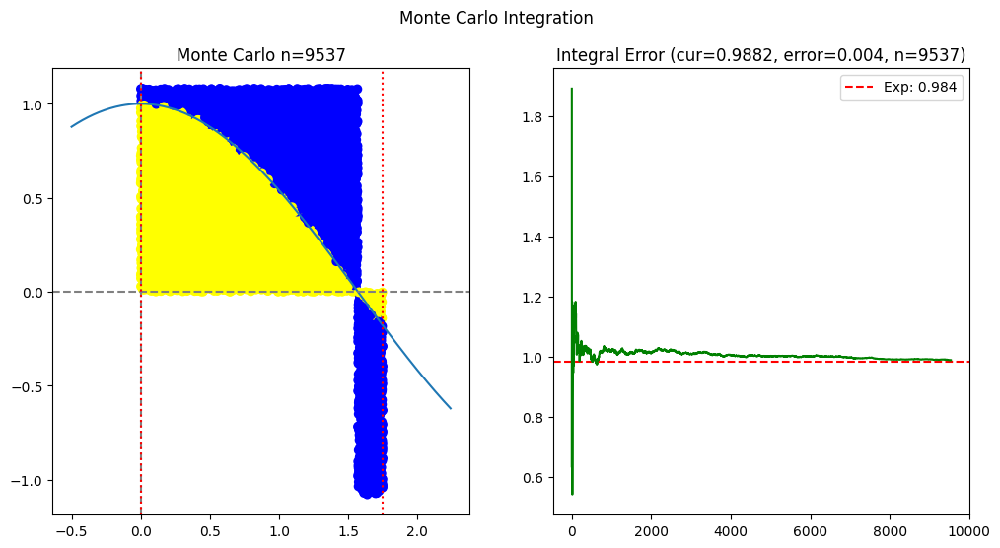

In [368]:
def cos_fun(x):
    # set cosine coefficients here:
    a = 1
    b = 1
    c = 0
    d = 0
    return a * np.cos(b*x + c) + d


# call monteplots 
# integral(function, a, b)

#              function  x0  x1   tolerance   min points   increment scale
mp = MontePlots(cos_fun, 0, 1.75, tol=0.01, min_points=110, point_scl=1.5)
mp.run_monte() 

 


# GENERATE ANIMATION<a id='gen-anim'></a>
To create an animation of the Monte Carlo Process run the next cell (animation will be embedded within jupyter notebook):

If the animation does not play, you may need to re-run the previous cell.

**FFMPEG Library is required for this to run!**

If for whatever reason this animation does not embed correctly or fails to run, please check 
the sample_animation.mp4 file for an example of the output.


**This will take ~30s - 1min to complete, please be patient :)**

In [307]:
mp.animate_monte()
HTML(mp.anim.to_jshtml())


# Notes and Results<a id=''></a>
#### Notes / Results:
This was an interesting simulation to run, and creating a system for tolerances and messing with the animation was quite fun.

From my testng, it seems like scaling values around `2.1`, with `50` minimum points, was best, as other scaling settings would result in a large dot count with no significant improvement after the 1000th-1500th point. This increment got values that were within the tolerance but didn't use >10000 points most of the time. 

A general rule seemed to be, tighter tolerances = more minimum points, looser tolerance = less minimum points
and higher scaling = less minimum points while lower scaling = higher minimum points. This, of course, is just based on the many times I ran it and is no means a good metric for tuning anything.


I'm sure with further tuning you could find values which would result in a more efficient method to find the number of dots needed.



Another interesting thing is that a lot of it is based on luck, as sometimes the simulation would complete with 500-800 points while other times the same function would need 3000, or even >10,000 points to reach the accuracy we want. That's partly due to how tolerance is measured and our scaling value, though.

#### How to make it better in the future:
I think a good way to mitigate the sporadic point counts on each run would be to have some logic that would check consistency for a span of previous runs rather than comparing only the last two. This span would change based on the scale factor, so higher scaling would check lower spans, and lower scaling would check longer spans. That way, we aren't processing points when we don't need to. In addition, this may remove the need to specify a scaling factor and minimum points, as the function would figure that out. 

Another fun idea would be to get a best fit line of the second green plot to get use its slope to get a rough estimate of the derivative. Then the tolerance can refer to how close that derivative is to zero and at that point we have leveled off and reached the desired value. This probably has complications of its own, so I'm not to sure how far you could go with this